In [1]:
import pandas as pd
import geopandas as gpd

In [31]:
rest = pd.read_csv('../RawData/fulldata_07_24_04_P_일반음식점.csv', encoding = 'cp949')
cafe = pd.read_csv('../RawData/fulldata_07_24_05_P_휴게음식점.csv', encoding = 'cp949')

C:\Users\Chulwoong Park\AppData\Local\Temp\ipykernel_30140\2354271454.py:1: DtypeWarning: Columns (11,27,39,41,44,45) have mixed types. Specify dtype option on import or set low_memory=False.
  rest = pd.read_csv('../RawData/fulldata_07_24_04_P_일반음식점.csv', encoding = 'cp949')
C:\Users\Chulwoong Park\AppData\Local\Temp\ipykernel_30140\2354271454.py:2: DtypeWarning: Columns (11,39,44,45) have mixed types. Specify dtype option on import or set low_memory=False.
  cafe = pd.read_csv('../RawData/fulldata_07_24_05_P_휴게음식점.csv', encoding = 'cp949')


In [32]:
rest = rest[['번호', '개방자치단체코드', '영업상태명', '소재지전체주소', '좌표정보(x)', '좌표정보(y)']]
def get_si(x):
    x = str(x)
    return x.split(' ')[0]
rest.drop(rest[rest['영업상태명'] == '폐업'].index, inplace = True)
rest['sido'] = rest['소재지전체주소'].apply(get_si)
rest = rest[rest['sido'] == '서울특별시']
rest.to_csv('../RawData/Seoul_rest.csv', encoding = 'cp949')

In [33]:
cafe = cafe[['번호', '개방자치단체코드', '영업상태명', '소재지전체주소', '좌표정보(x)', '좌표정보(y)']]
def get_si(x):
    x = str(x)
    return x.split(' ')[0]
cafe.drop(cafe[cafe['영업상태명'] == '폐업'].index, inplace = True)
cafe['sido'] = cafe['소재지전체주소'].apply(get_si)
cafe = cafe[cafe['sido'] == '서울특별시']
cafe.to_csv('../RawData/Seoul_cafe.csv', encoding = 'cp949')

In [35]:
seoul_rest = pd.concat([rest,cafe])
seoul_rest.to_csv('../RawData/Seoul_eating.csv', encoding = 'cp949')

In [41]:
park = gpd.read_file('../RawData/공원(열린데이터광장)/SeoulPark.shp')
park.head(3)

,ID,CODE,ENT_NAME,JOSER_ID,GOSI_ID,LABEL,GOSI_DATE,geometry
0,생활서비스시설_공원_0033,ZON216,생활서비스시설_공원,None,None,강변공원(망원지구),None,"POLYGON ((946499.921 1950958.749, 946507.641 1..."
1,생활서비스시설_공원_0034,ZON216,생활서비스시설_공원,None,None,강변공원((광나루지구)),None,"POLYGON ((964058.751 1946743.549, 963995.095 1..."
2,생활서비스시설_공원_0036,ZON216,생활서비스시설_공원,None,None,강변공원(잠실지구),None,"POLYGON ((957156.008 1947432.167, 957193.606 1..."


In [42]:
def get_type(x):
    return x.split('(')[0]
park['park_type'] = park['LABEL'].apply(get_type)

In [47]:
park_list = ['강변공원',  '근린공원', '묘지공원', '광장', '도시자연공원','하천']
park_new = park[park['park_type'].isin(park_list)]
park_new.to_file('../Data/ParkInfo.shp', encoding = 'utf8')

In [2]:
raw_y = pd.read_csv('../Data/raw_y.csv')
raw_y.head(2)

,Unnamed: 0,index,id,name,weekend,hacha,max_ride,min_ride,pattern
0,0,0,6,가락시장,0,0,2352.0,63.4,"[0.08485537009525475, 0.2041422703836407, 0.64..."
1,1,1,7,송파,0,0,1710.6,12.0,"[0.07229483103732487, 0.24137525020605205, 0.8..."


C:\Users\Chulwoong Park\AppData\Local\Temp\ipykernel_14792\2489858167.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (10, 5), facecolor = 'white')


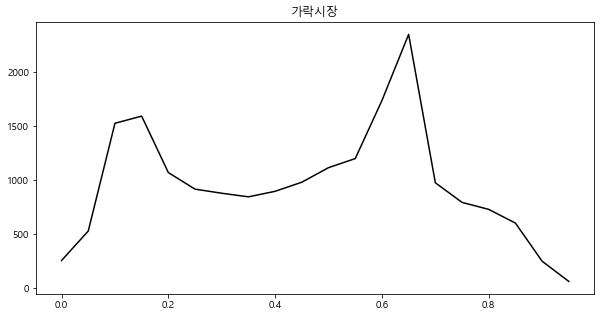

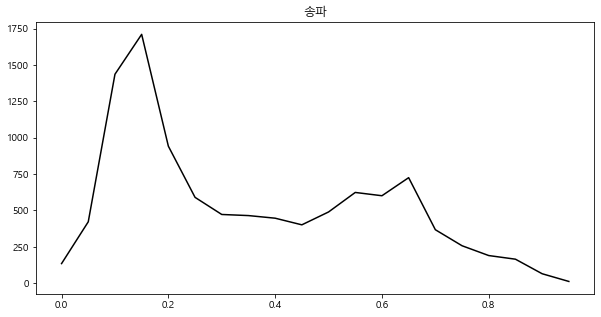

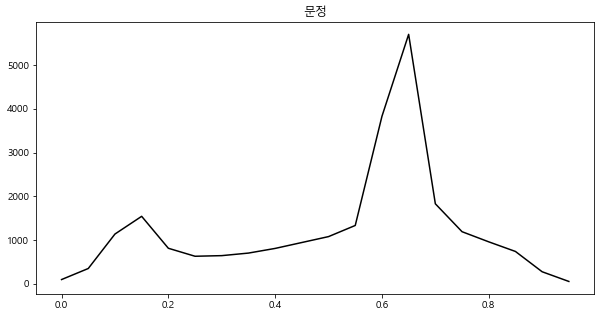

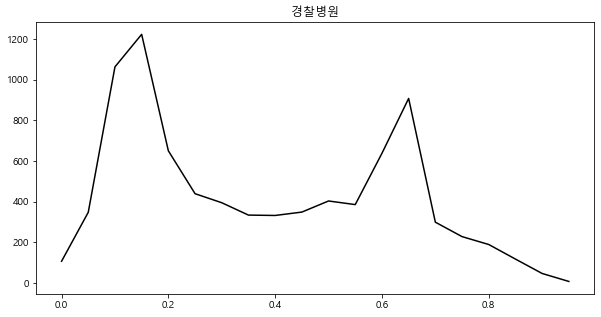

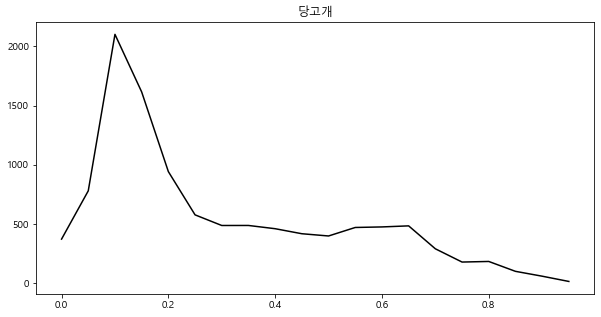

...

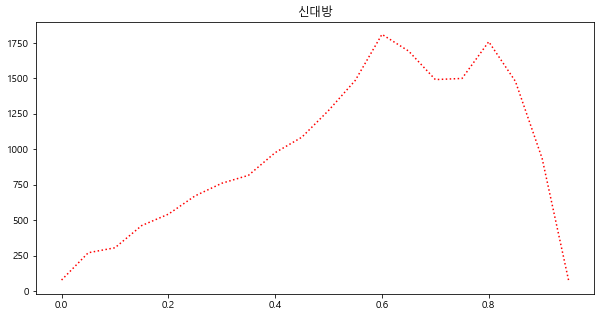

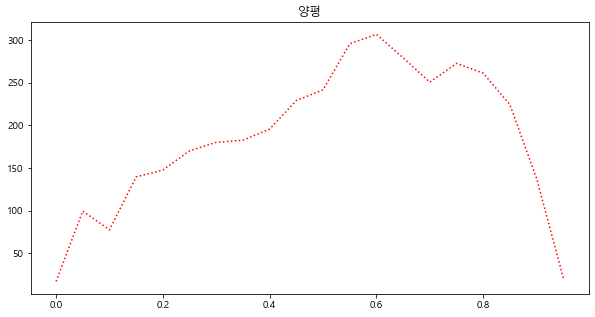

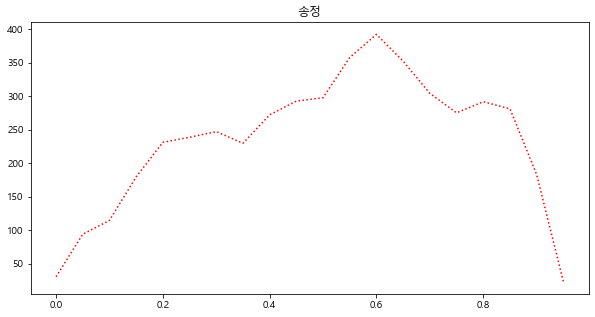

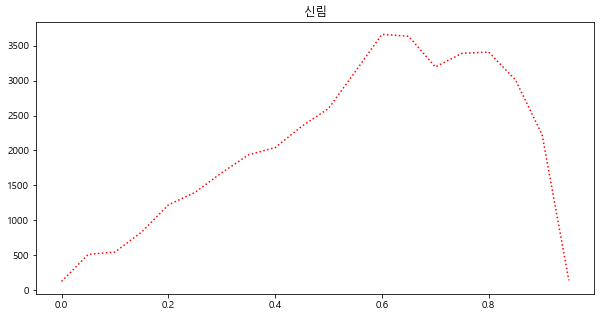

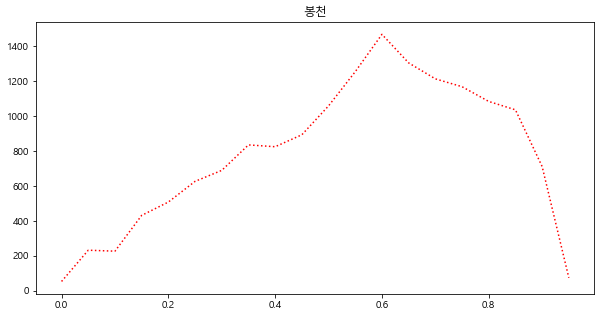

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
#plt.rcParams['axes.unicode_minus'] =False
#plt.rc('font', family='NanumGothic')
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False

def str_to_arr(x):
    return np.array([float(i) for i in x[1:-1].strip().split()])


for k, v in raw_y.iterrows():
    y = v['pattern'][1:-1].strip().split()
    y = [i.split(',')[0] for i in y]
    y_np = [float(i) for i in y]
    max_y, min_y = v['max_ride'], v['min_ride']
    y_unnorm = [x*(max_y - min_y) + min_y for x in y_np]
    fig = plt.figure(figsize = (10, 5), facecolor = 'white')
    t = np.linspace(0, 1, len(y_np), endpoint = False)
    station_name = v['name']
    plt.title(station_name)
    
    if v['weekend'] == 0 and v['hacha'] == 0:
        st = 'wd_sc'
        plt.plot(t, y_unnorm, label = 'original', color = 'black')
        plt.savefig(f'../img/{station_name}_{st}.png')
    elif v['weekend'] == 0 and v['hacha'] == 1:
        st = 'wd_hc'
        plt.plot(t, y_unnorm, label = 'original', color = 'black', linestyle = 'dotted')
        plt.savefig(f'../img/{station_name}_{st}.png')
    elif v['weekend'] == 1 and v['hacha'] == 0:
        st = 'wk_sc'
        plt.plot(t, y_unnorm, label = 'original', color = 'red')
        plt.savefig(f'../img/{station_name}_{st}.png')
    elif v['weekend'] == 1 and v['hacha'] == 1:
        st = 'wk_hc'
        plt.plot(t, y_unnorm, label = 'original', color = 'red', linestyle = 'dotted')
        plt.savefig(f'../img/{station_name}_{st}.png')
